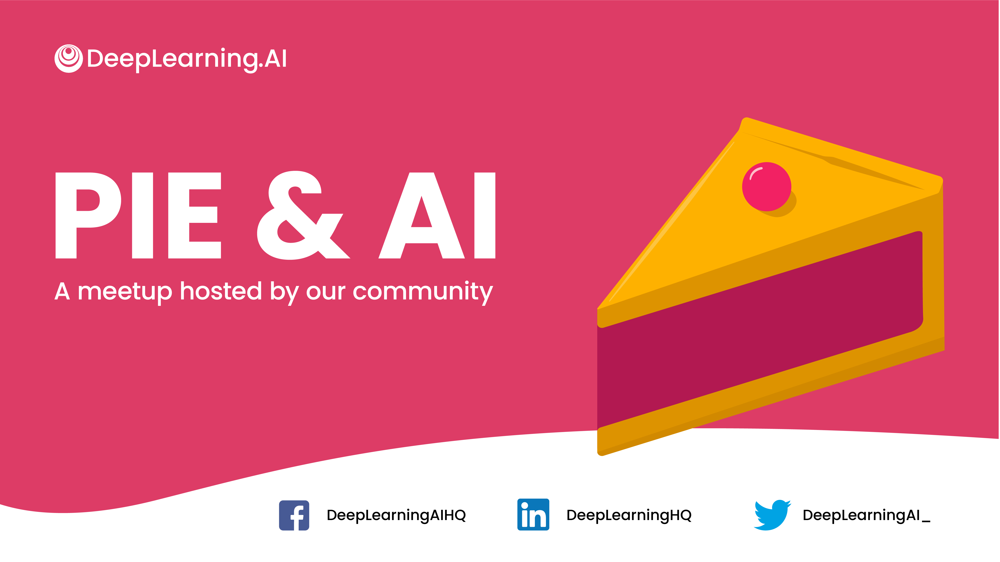

# From Traditional Programming to ML

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
ticker = "GOOG"

df = yf.download(
    ticker,
    start="2020-01-01",
    auto_adjust=True,
    progress=False
)

In [ ]:
if isinstance(df.columns, pd.MultiIndex):
    df.columns = df.columns.get_level_values(0)

In [ ]:
df.head()

In [ ]:
print("Observations:", len(df))
print("Columns:", list(df.columns))
print("\nMissing values:")
print(df.isna().sum())

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(df.index, df["Close"])
plt.title("GOOG — Historical Closing Price")
plt.xlabel("Date")
plt.ylabel("Price")
plt.grid(alpha=0.3)
plt.show()

У нас є дані. Але поки що немає ML.

Традиційне програмування вимагає від нас написання правил.

In [ ]:
def traditional_rule(today_close, yesterday_close):
    if today_close > yesterday_close:
        return "UP"
    else:
        return "DOWN"

In [ ]:
yesterday_close = 235.17
today_close = 238.42

prediction = traditional_rule(
    today_close,
    yesterday_close
)

print("Prediction:", prediction)

Але зверніть увагу: комп'ютер тут нічого не навчився.
Умову today_close > yesterday_close написали ми.

In [ ]:
df["Previous_Close"] = df["Close"].shift(1)

df["Rule_Prediction"] = np.where(
    df["Close"] > df["Previous_Close"],
    "UP",
    "DOWN"
)

df[["Close", "Previous_Close", "Rule_Prediction"]].tail()

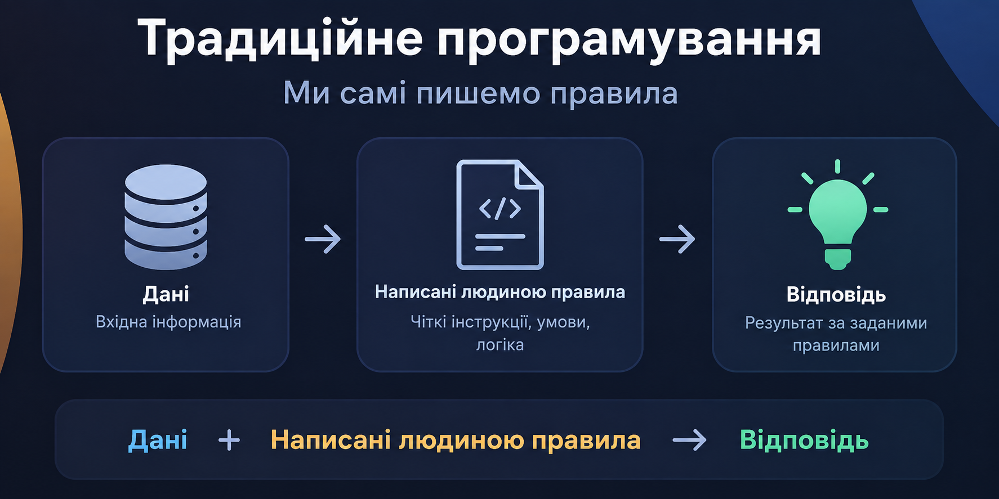

А що, якщо результат залежить не від одного значення?

In [ ]:
def trading_rule(
    close,
    moving_average,
    daily_return,
    volume,
    average_volume
):
    if (
        close > moving_average
        and daily_return > 0
        and volume > average_volume
    ):
        return "UP"
    else:
        return "DOWN"

Ми можемо додавати нові умови: moving average, return, volume, volatility...

Але тоді виникають нові питання. Який moving average? Який поріг return? Наскільки важливий volume? Що робити, якщо одні indicators суперечать іншим?

Ми можемо продовжувати писати if, and, else. Але фактично ми намагаємося вручну описати складну залежність.

In [ ]:
df["Return"] = df["Close"].pct_change()
df["MA_5"] = df["Close"].rolling(5).mean()

df["Rule_Prediction"] = np.where(
    (df["Close"] > df["MA_5"]) &
    (df["Return"] > 0),
    "UP",
    "DOWN"
)

df[["Close", "Return", "MA_5", "Rule_Prediction"]].tail(10)

Якщо поточна ціна вища за п'ятиденне середнє і сьогоднішня дохідність позитивна, ми вручну прогнозуємо, що наступний день буде UP.

In [ ]:
df["Next_Close"] = df["Close"].shift(-1)

df["Actual"] = np.where(
    df["Next_Close"] > df["Close"],
    "UP",
    "DOWN"
)

df[[
    "Close",
    "MA_5",
    "Return",
    "Rule_Prediction",
    "Actual"
]].dropna().tail(10)

In [ ]:
results = df.dropna().copy()

accuracy = (
    results["Rule_Prediction"] == results["Actual"]
).mean()

print(f"Кількість спостережень: {len(results)}")
print(f"Точність нашого правила: {accuracy:.2%}")

In [ ]:
results["Correct"] = (
    results["Rule_Prediction"] == results["Actual"]
)

results[
    ["Close", "Return", "MA_5",
     "Rule_Prediction", "Actual", "Correct"]
].tail(10)

Але що робити, якщо зв'язок занадто складний, щоб його можна було виразити як правило?

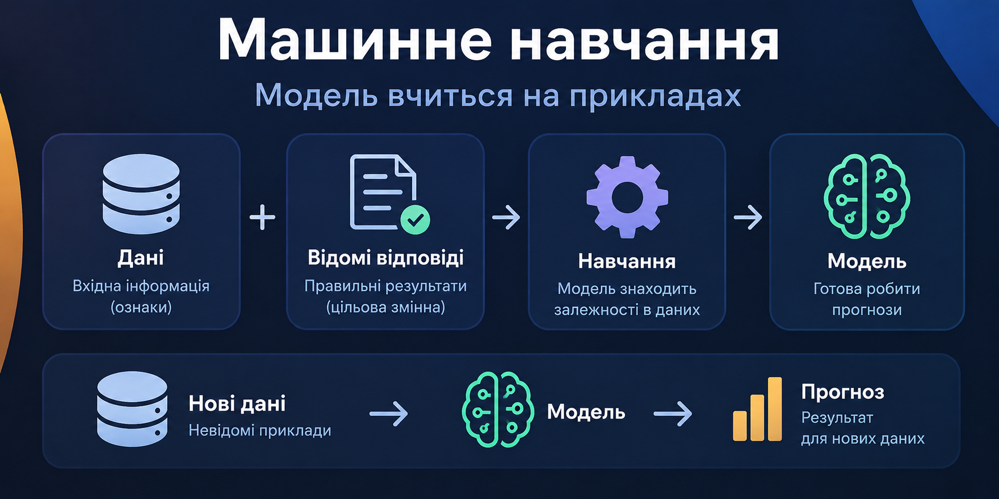

In [ ]:
df["Next_Close"] = df["Close"].shift(-1)

df["Target"] = np.where(
    df["Next_Close"] > df["Close"],
    1,
    0
)

df[["Close", "Next_Close", "Target"]].tail(10)

Пояснення:

*   1 = наступного дня ціна зросла
*   0 = наступного дня ціна не зросла

Тепер створюємо кілька простих ознак:

In [ ]:
df["Return"] = df["Close"].pct_change()
df["MA_5"] = df["Close"].rolling(5).mean()
df["MA_10"] = df["Close"].rolling(10).mean()
df["Volatility"] = df["Return"].rolling(10).std()

І дивимося:

In [ ]:
df[[
    "Close",
    "Return",
    "MA_5",
    "MA_10",
    "Volatility",
    "Target"
]].dropna().tail(10)

У традиційному програмуванні ми самі писали правило: якщо ціна вище середнього і return прогноз UP.

У машинному навчанні ми не задаємо це правило напряму. Ми даємо моделі ознаки і відомий результат, а вона намагається сама знайти залежність.

In [ ]:
features = [
    "Return",
    "MA_5",
    "MA_10",
    "Volatility",
    "Volume"
]

ml_data = df[features + ["Target"]].dropna()

X = ml_data[features]
y = ml_data["Target"]

print("Features:")
display(X.head())

print("\nTarget:")
display(y.head())

Тепер у нас є X — інформація, яку отримує модель, і y — правильна відповідь, на якій вона навчається.

Але як модель фактично знаходить залежність між X і y?

Для цього нам потрібно зрозуміти, що таке нейронна мережа.

# Understanding Neural Networks

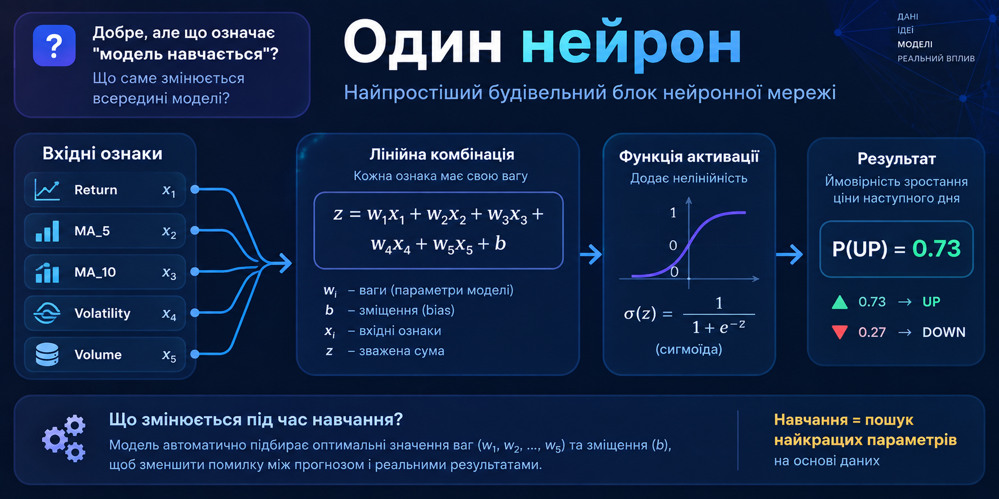

Ми маємо 5 фінансових ознак. давайте створимо один нейрон і побачимо в чому в нас справа:

In [ ]:
import torch
import torch.nn as nn

neuron = nn.Linear(
    in_features=5,
    out_features=1
)

print(neuron)

Подивимося, що знаходиться всередині:

In [ ]:
print("Ваги:")
print(neuron.weight)

print("\nЗміщення:")
print(neuron.bias)

Ось вони — параметри моделі. П'ять входів означають п'ять ваг. Спочатку вони ініціалізовані автоматично. Під час навчання модель буде змінювати ці значення так, щоб зменшувати помилку.

Ми ще нічого не навчили. PyTorch лише створив параметри моделі та задав їм початкові значення.

Для демонстрації візьмемо умовно нормалізовані значення наших п'яти ознак:

In [ ]:
x = torch.tensor([
    [0.40, 0.25, 0.15, 0.30, 0.60]
], dtype=torch.float32)

z = neuron(x)

print("Лінійний результат:", z.item())

Але z ще незручно трактувати як імовірність. Тому додаємо sigmoid:

In [ ]:
probability = torch.sigmoid(z)

print(
    f"Ймовірність UP: "
    f"{probability.item():.2%}"
)

In [ ]:
def sigmoid(z):
    """
    Compute the sigmoid of z

    Args:
        z (ndarray): A scalar, numpy array of any size.

    Returns:
        g (ndarray): sigmoid(z), with the same shape as z

    """

    g = 1/(1+np.exp(-z))

    return g

Ось тут починається власне learning.
Припустимо, ми знаємо, що наступного дня ціна справді зросла:

In [ ]:
y_true = torch.tensor([
    [1.0]
])

Тоді порівнюємо:

In [ ]:
print("Прогноз:", probability.item())
print("Правильна відповідь:", y_true.item())

Модель зробила prediction. У нас є actual value. Тепер потрібен спосіб виміряти, наскільки prediction відрізняється від правильної відповіді.

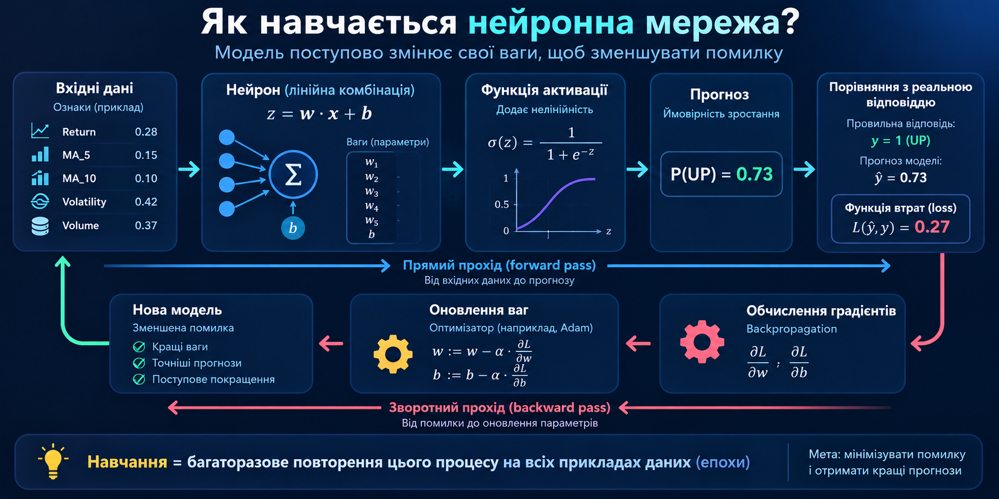

In [ ]:
# Один нейрон: 5 ознак → 1 результат
neuron = nn.Linear(5, 1)

# Один приклад
x = torch.tensor(
    [[0.40, 0.25, 0.15, 0.30, 0.60]],
    dtype=torch.float32
)

# Фактичний результат: UP
y_true = torch.tensor([[1.0]])

Тепер визначаємо loss та optimizer:

In [ ]:
loss_function = nn.BCEWithLogitsLoss()

optimizer = torch.optim.SGD(
    neuron.parameters(),
    lr=0.1
)

In [ ]:
z = neuron(x)
probability_before = torch.sigmoid(z)

print(
    f"Ймовірність UP до навчання: "
    f"{probability_before.item():.2%}"
)

In [ ]:
loss = loss_function(z, y_true)

print(
    f"Loss: {loss.item():.4f}"
)

Модель зробила прогноз. Ми знаємо правильну відповідь. Loss function перетворює різницю між ними на число, яке модель повинна мінімізувати.

Ось ключові дві команди:

In [ ]:
optimizer.zero_grad()

loss.backward()

loss.backward() — одна з найважливіших команд цієї демонстрації. PyTorch обчислює, як кожна вага вплинула на помилку.

In [ ]:
print("Градієнти ваг:")
print(neuron.weight.grad)

print("\nГрадієнт bias:")
print(neuron.bias.grad)

In [ ]:
optimizer.step()

І робимо прогноз ще раз:

In [ ]:
with torch.no_grad():
    z = neuron(x)
    probability_after = torch.sigmoid(z)

print(
    f"До навчання:    {probability_before.item():.2%}"
)

print(
    f"Після 1 кроку:  {probability_after.item():.2%}"
)

Ми не написали нове правило if. Не сказали моделі, яку вагу поставити для Return чи Volume.
Вона зробила прогноз, виміряла помилку, обчислила gradients і змінила свої параметри.

Один нейрон робить це один раз. Нейронна мережа має багато нейронів. А training повторює цей процес багато разів на великій кількості прикладів.

# From Financial Data to an ML Problem

Ми розуміємо механізм навчання. Але що саме повинна навчитися прогнозувати наша модель?

Використовуючи інформацію, доступну сьогодні, визначити, чи буде ціна закриття наступного торгового дня вищою за сьогоднішню.

In [ ]:
df["Next_Close"] = df["Close"].shift(-1)

df["Target"] = (
    df["Next_Close"] > df["Close"]
).astype(int)

df[[
    "Close",
    "Next_Close",
    "Target"
]].tail(10)

Останній рядок треба прибрати, тому що для нього ми ще не знаємо наступного дня:

In [ ]:
df = df.iloc[:-1].copy()

Модель не повинна отримувати майбутнє. Тому всі features формуємо лише з інформації, відомої на момент прогнозу:

In [ ]:
df["Return"] = df["Close"].pct_change()

df["MA_5"] = (
    df["Close"].rolling(5).mean()
)

df["MA_10"] = (
    df["Close"].rolling(10).mean()
)

df["Volatility"] = (
    df["Return"].rolling(10).std()
)

df["Volume_Change"] = (
    df["Volume"].pct_change()
)

Тепер:

In [ ]:
features = [
    "Return",
    "MA_5",
    "MA_10",
    "Volatility",
    "Volume_Change"
]

ml_data = df[
    features + ["Target"]
].dropna()

ml_data.head()

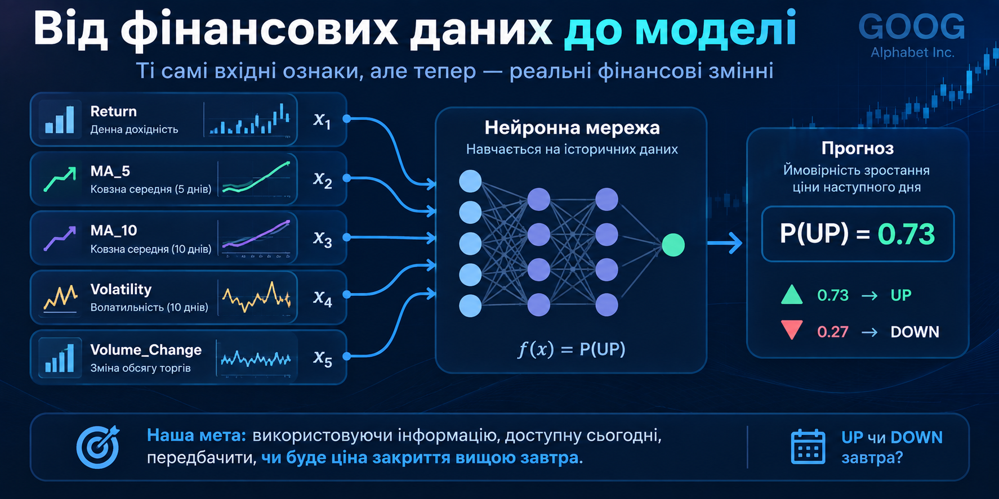

Ось момент, коли financial data перетворилися на machine-learning problem.
X — те, що модель знає. y — те, що ми хочемо навчитися прогнозувати.

In [ ]:
X = ml_data[features]
y = ml_data["Target"]

print("X — features")
display(X.head())

print("\ny — target")
display(y.head())

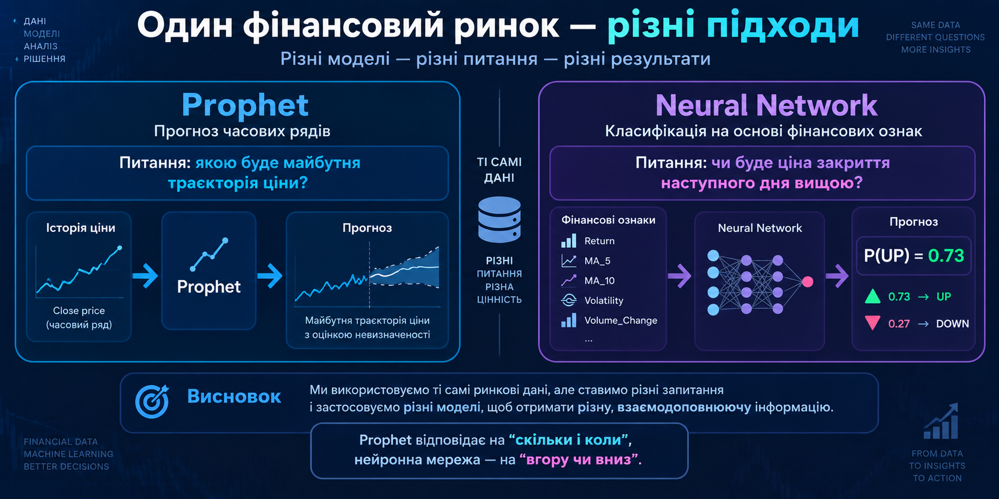

In [ ]:
!pip -q install yfinance prophet

In [ ]:
from prophet import Prophet

prophet_data = pd.DataFrame({
    "ds": df.index,
    "y": df["Close"].values
})

prophet_data.head()

Далі модель:

In [ ]:
model_prophet = Prophet()

model_prophet.fit(prophet_data)

Створюємо горизонт прогнозування, наприклад 30 днів:

In [ ]:
future = model_prophet.make_future_dataframe(
    periods=30
)

forecast = model_prophet.predict(future)

forecast[[
    "ds",
    "yhat",
    "yhat_lower",
    "yhat_upper"
]].tail()

In [ ]:
model_prophet.plot(forecast)

plt.title("GOOG — Prophet Forecast")
plt.xlabel("Date")
plt.ylabel("Price")
plt.show()

Prophet отримав історичний часовий ряд і побудував його майбутню траєкторію. Зверніть увагу, результат тут — не UP або DOWN. Ми отримуємо yhat — прогнозоване значення, а також нижню та верхню межі інтервалу невизначеності.

А що, якщо нас цікавить інше питання: не якою буде траєкторія ціни, а яка ймовірність того, що наступного дня вона буде вищою?

Механізм навчання ми вже побачили в PyTorch. Тепер не будемо вручну писати training loop — побудуємо повну модель у Keras

# TensorFlow/Keras practical demo

Будуємо повну модель компактніше й зосереджуємось на самій задачі прогнозування.

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [ ]:
ticker = "GOOG"

data = yf.download(
    ticker,
    start="2018-01-01",
    end="2026-09-12",
    auto_adjust=True,
    progress=False
)

if isinstance(data.columns, pd.MultiIndex):
    data.columns = data.columns.get_level_values(0)

data["Return_1"] = data["Close"].pct_change()
data["Return_5"] = data["Close"].pct_change(5)
data["MA_5"] = data["Close"].rolling(5).mean()
data["MA_10"] = data["Close"].rolling(10).mean()
data["Price_MA5"] = data["Close"] / data["MA_5"] - 1
data["Price_MA10"] = data["Close"] / data["MA_10"] - 1
data["Volatility_10"] = data["Return_1"].rolling(10).std()
data["Volume_Change"] = data["Volume"].pct_change()

data["Target"] = (data["Close"].shift(-1) > data["Close"]).astype(int)
data = data.iloc[:-1]  # drop last row, no known next-day outcome

feature_cols = [
    "Return_1", "Return_5", "Price_MA5",
    "Price_MA10", "Volatility_10", "Volume_Change"
]

ml_data = data[feature_cols + ["Target"]].dropna()

X = ml_data[feature_cols].values.astype("float32")
y = ml_data["Target"].values.astype("float32")

print("Feature matrix:", X.shape)
print("Target balance:", y.mean().round(3), "(share of UP days)")

In [ ]:
n = len(X)
train_end = int(n * 0.70)
val_end = int(n * 0.90)

X_train, y_train = X[:train_end], y[:train_end]
X_val, y_val = X[train_end:val_end], y[train_end:val_end]
X_test, y_test = X[val_end:], y[val_end:]

print("Train:", len(X_train), "Val:", len(X_val), "Test:", len(X_test))

Ми беремо шість відомих цін Google і просимо модель навчитися прогнозувати шосту. Потім пересуваємо це вікно на один торговий день і повторюємо процес.

In [ ]:
mean = X_train.mean(axis=0)
std = X_train.std(axis=0)

X_train_scaled = (X_train - mean) / std
X_val_scaled = (X_val - mean) / std
X_test_scaled = (X_test - mean) / std

Тепер нормалізація. Для коректності параметри беремо тільки з training data:

In [ ]:
majority_class = int(y_train.mean() > 0.5)
naive_predictions = np.full_like(y_test, majority_class)
naive_accuracy = (naive_predictions == y_test).mean() * 100

print(f"Naive Baseline Accuracy (always predict {majority_class}): {naive_accuracy:.2f}%")

In [ ]:
majority_class = int(y_train.mean() > 0.5)
naive_majority_acc = (np.full_like(y_test, majority_class) == y_test).mean() * 100

# persistence: "завтра як вчора" — попередній Target
prev_target = ml_data["Target"].shift(1).values[val_end:]
naive_persistence_acc = (prev_target == y_test).mean() * 100

print(f"Naive (majority class):  {naive_majority_acc:.2f}%")
print(f"Naive (persistence):     {naive_persistence_acc:.2f}%")

Далі сама TensorFlow/Keras модель:

In [ ]:

model = keras.Sequential([
    layers.Input(shape=(X_train_scaled.shape[1],)),
    layers.Dense(16, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(16, activation="relu"),
    layers.Dense(1, activation="sigmoid")
])

model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

model.summary()

На вході модель має лише 5 чисел — ціни GOOG за п'ять попередніх торгових днів. Два приховані шари намагаються навчитися перетворенню цієї короткої історії на прогноз наступної ціни.

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

history = model.fit(
    X_train_scaled, y_train,
    validation_data=(X_val_scaled, y_val),
    epochs=100,
    batch_size=32,
    shuffle=False,
    callbacks=[early_stopping],
    verbose=1
)

На кожній епосі модель проходить навчальні приклади, обчислює помилку і коригує свої ваги. Validation data не використовується для зміни ваг — вона лише показує, наскільки добре модель узагальнює.

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.title("TensorFlow/Keras Training")
plt.xlabel("Epoch")
plt.ylabel("Binary Crossentropy Loss")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

val_proba = model.predict(X_val_scaled, verbose=0).flatten()
thresholds = np.arange(0.3, 0.71, 0.01)
best_thr = max(
    thresholds,
    key=lambda t: accuracy_score(y_val, (val_proba > t).astype(int))
)
print(f"Best threshold on validation: {best_thr:.2f}")

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# 4. Фінальна оцінка — з підібраним порогом, не з 0.5
pred_proba = model.predict(X_test_scaled, verbose=0).flatten()
pred_labels = (pred_proba > best_thr).astype(int)

test_accuracy = (pred_labels == y_test).mean() * 100
test_auc = roc_auc_score(y_test, pred_proba) * 100

print("TENSORFLOW/KERAS — FINAL RESULTS")
print("=" * 44)
print(f"Naive (majority class):   {naive_majority_acc:.2f}%")
print(f"Naive (persistence):      {naive_persistence_acc:.2f}%")
print(f"TensorFlow Accuracy:      {test_accuracy:.2f}%")
print(f"TensorFlow ROC AUC:       {test_auc:.2f}%")
print()
print(classification_report(y_test, pred_labels, target_names=["DOWN", "UP"]))
print(confusion_matrix(y_test, pred_labels))

In [ ]:
target_dates = ml_data.index
test_dates = target_dates[val_end:]

close_test = data.loc[test_dates, "Close"]

correct = pred_labels == y_test

plt.figure(figsize=(14, 6))

plt.plot(
    test_dates,
    close_test,
    color="gray",
    alpha=0.6,
    label="GOOG Close"
)

plt.scatter(
    test_dates[correct],
    close_test[correct],
    color="green",
    s=25,
    label="Correct direction",
    zorder=3
)

plt.scatter(
    test_dates[~correct],
    close_test[~correct],
    color="red",
    s=25,
    label="Wrong direction",
    zorder=3
)

plt.title("GOOG — Test Period, Directional Predictions")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.legend()
plt.grid(alpha=0.3)

plt.show()

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=5)
fold_accuracies = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
    X_tr, X_te = X[train_idx], X[test_idx]
    y_tr, y_te = y[train_idx], y[test_idx]

    m = X_tr.mean(axis=0)
    s = X_tr.std(axis=0)
    X_tr_s = (X_tr - m) / s
    X_te_s = (X_te - m) / s

    fold_model = keras.Sequential([
        layers.Input(shape=(X_tr_s.shape[1],)),
        layers.Dense(16, activation="relu"),
        layers.Dropout(0.2),
        layers.Dense(16, activation="relu"),
        layers.Dense(1, activation="sigmoid")
    ])
    fold_model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    fold_model.fit(X_tr_s, y_tr, epochs=30, batch_size=32, verbose=0)

    _, acc = fold_model.evaluate(X_te_s, y_te, verbose=0)
    fold_accuracies.append(acc * 100)
    print(f"Fold {fold+1} accuracy: {acc*100:.2f}%")

print(f"\nMean accuracy across folds: {np.mean(fold_accuracies):.2f}% (± {np.std(fold_accuracies):.2f})")

# Machine Learning with SQL: BigQuery ML

Ми щойно побудували модель у Python за допомогою TensorFlow/Keras. Але чи обов'язково писати Python-код, щоб навчити ML-модель? У Google BigQuery частину цього процесу можна виконати безпосередньо за допомогою SQL.

[SandBox](https://console.cloud.google.com/bigquery?project=pie-ai-kyiv-september-16&supportedpurview=project&ws=!1m6!1m5!5m3!1spie-ai-kyiv-september-16!2spie_ai!3sgoog_direction_model!23sTREE_NODE_SELECTION$0)

In [ ]:
bq_data = data.copy()

bq_data["Return_1"] = bq_data["Close"].pct_change()
bq_data["Return_5"] = bq_data["Close"].pct_change(5)

bq_data["MA_5"] = bq_data["Close"].rolling(5).mean()
bq_data["MA_10"] = bq_data["Close"].rolling(10).mean()

bq_data["Price_MA5"] = (
    bq_data["Close"] / bq_data["MA_5"] - 1
)

bq_data["Price_MA10"] = (
    bq_data["Close"] / bq_data["MA_10"] - 1
)

bq_data["Volatility_10"] = (
    bq_data["Return_1"].rolling(10).std()
)

bq_data["Volume_Change"] = (
    bq_data["Volume"].pct_change()
)

bq_data["Next_Close"] = (
    bq_data["Close"].shift(-1)
)

bq_data["Target"] = (
    bq_data["Next_Close"] > bq_data["Close"]
).astype(int)

bq_data = bq_data.dropna().copy()

In [ ]:
split_index = int(
    len(bq_data) * 0.8
)

bq_data["split"] = "TEST"

bq_data.iloc[
    :split_index,
    bq_data.columns.get_loc("split")
] = "TRAIN"

In [ ]:
bq_data = bq_data[
    [
        "Return_1",
        "Return_5",
        "Price_MA5",
        "Price_MA10",
        "Volatility_10",
        "Volume_Change",
        "Target",
        "split"
    ]
]

In [ ]:
bq_data.to_csv(
    "goog_training.csv",
    index=False
)

from google.colab import files

files.download(
    "goog_training.csv"
)

Або просто продовжкємо працювати в нашому середовищі


In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
PROJECT_ID = "pie-ai-kyiv-september-16"
DATASET_ID = "pie_ai"

In [ ]:
from google.cloud import bigquery

client = bigquery.Client(
    project=PROJECT_ID
)

print("Connected to:", client.project)

In [ ]:
query = """
SELECT
  COUNT(*) AS row_count
FROM
  `pie-ai-kyiv-september-16.pie_ai.goog_training`
"""

result = client.query(query).to_dataframe()
result

In [ ]:
query = """
CREATE OR REPLACE MODEL
  `pie-ai-kyiv-september-16.pie_ai.goog_direction_model`

OPTIONS(
  model_type = 'LOGISTIC_REG',
  input_label_cols = ['Target']
) AS

SELECT
  Return_1,
  Return_5,
  Price_MA5,
  Price_MA10,
  Volatility_10,
  Volume_Change,
  Target

FROM
  `pie-ai-kyiv-september-16.pie_ai.goog_training`

WHERE
  split = 'TRAIN'
"""

client.query(query).result()

print("BigQuery ML model created.")

In [ ]:
query = """
SELECT *
FROM ML.EVALUATE(
  MODEL `pie-ai-kyiv-september-16.pie_ai.goog_direction_model`,
  (
    SELECT
      Return_1,
      Return_5,
      Price_MA5,
      Price_MA10,
      Volatility_10,
      Volume_Change,
      Target
    FROM
      `pie-ai-kyiv-september-16.pie_ai.goog_training`
    WHERE
      split = 'TEST'
  )
)
"""

evaluation = client.query(query).to_dataframe()
evaluation

In [ ]:
import pandas as pd

# -----------------------------
# 1. BigQuery ML evaluation
# -----------------------------

bq_query = """
SELECT *
FROM ML.EVALUATE(
  MODEL `pie-ai-kyiv-september-16.pie_ai.goog_direction_model`,
  (
    SELECT
      Return_1,
      Return_5,
      Price_MA5,
      Price_MA10,
      Volatility_10,
      Volume_Change,
      Target
    FROM
      `pie-ai-kyiv-september-16.pie_ai.goog_training`
    WHERE
      split = 'TEST'
  )
)
"""

bq_eval = client.query(bq_query).to_dataframe()

bq_accuracy = bq_eval.loc[0, "accuracy"] * 100
bq_precision = bq_eval.loc[0, "precision"] * 100
bq_recall = bq_eval.loc[0, "recall"] * 100
bq_f1 = bq_eval.loc[0, "f1_score"] * 100
bq_roc_auc = bq_eval.loc[0, "roc_auc"] * 100


# -----------------------------
# 2. Collect all results
# -----------------------------

final_results = pd.DataFrame({
    "Model": [
        "Traditional Rule",
        "TensorFlow/Keras",
        "BigQuery ML",
        "BigQuery ML",
        "BigQuery ML",
        "BigQuery ML",
        "BigQuery ML"
    ],
    "Metric": [
        "Accuracy",
        "Accuracy",
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score",
        "ROC AUC"
    ],
    "Percent": [
        accuracy * 100,
        test_accuracy * 100,
        bq_accuracy,
        bq_precision,
        bq_recall,
        bq_f1,
        bq_roc_auc
    ]
})

final_results

In [ ]:
models = [
    "Traditional Rule",
    "TensorFlow/Keras",
    "BigQuery ML"
]

accuracies = [
    accuracy * 100,
    test_accuracy * 100,
    bq_accuracy
]

plt.figure(figsize=(10, 6))

bars = plt.bar(
    models,
    accuracies
)

plt.axhline(
    50,
    linestyle="--",
    label="50% Reference"
)

plt.ylabel("Accuracy (%)")
plt.title("GOOG Direction Prediction — Model Comparison")
plt.ylim(0, 100)
plt.legend()

for bar, value in zip(bars, accuracies):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 1,
        f"{value:.2f}%",
        ha="center"
    )

plt.show()

Traditional Rule
→ правила, написані людиною, майже не допомогли.

TensorFlow Directional Accuracy
→ learning approach знайшов деякий сигнал.

TensorFlow MAPE
→ прогноз рівня ціни виглядає дуже близьким, але це не те саме, що прогноз напрямку.

BigQuery ML Accuracy
→ проста Logistic Regression практично зрівнялася з neural network.

ROC AUC
→ однак загальна здатність відокремлювати UP від DOWN залишається слабкою.


Ми отримали прогноз. Але головне питання в машинному навчанні — не чи може модель видати число, а що це число насправді означає і наскільки ми можемо йому довіряти.